In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plantdisease/data/data.yaml
/kaggle/input/plantdisease/data/valid/labels/Corn___healthy_1137.txt
/kaggle/input/plantdisease/data/valid/labels/Grape___Black_rot_544.txt
/kaggle/input/plantdisease/data/valid/labels/Soybean___healthy_961.txt
/kaggle/input/plantdisease/data/valid/labels/Cherry___Powdery_mildew_586.txt
/kaggle/input/plantdisease/data/valid/labels/Potato___Early_blight_985.txt
/kaggle/input/plantdisease/data/valid/labels/Corn___Common_rust_1159.txt
/kaggle/input/plantdisease/data/valid/labels/Strawberry___healthy_248.txt
/kaggle/input/plantdisease/data/valid/labels/Apple___healthy_1343.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Septoria_leaf_spot_1566.txt
/kaggle/input/plantdisease/data/valid/labels/Potato___Late_blight_800.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Tomato_mosaic_virus_7.txt
/kaggle/input/plantdisease/data/valid/labels/Grape___Black_rot_463.txt
/kaggle/input/plantdisease/data/valid/labels/Tomato___Bacterial_spot_12

In [1]:
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

Cloning into 'yolov7'...
remote: Enumerating objects: 1197, done.
remote: Total 1197 (delta 0), reused 0 (delta 0), pack-reused 1197 (from 1)
Receiving objects: 100% (1197/1197), 74.23 MiB | 19.34 MiB/s, done.
Resolving deltas: 100% (519/519), done.
/kaggle/working/yolov7
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 82.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.8.3 requires cubinlinker, which is not installed.
cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.8.3 requires ptxcompiler, which is not installed.
cuml 24.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not 

In [2]:
import os
os.environ['WANDB_MODE'] = 'dryrun'

In [5]:
import shutil
shutil.copytree('/kaggle/input/plantdisease/data', '/kaggle/working/data', dirs_exist_ok=True)

'/kaggle/working/data'

In [6]:
data_yaml_path = '/kaggle/working/data/data.yaml'
with open(data_yaml_path, 'r') as file:
    yaml_data = file.read()

# Modify paths
yaml_data = yaml_data.replace('/kaggle/input/plantdisease/data', '/kaggle/working/data')

# Write back the updated file
with open(data_yaml_path, 'w') as file:
    file.write(yaml_data)

In [7]:
import os
os.environ['WANDB_MODE'] = 'disabled'

In [8]:
!python train.py --weights yolov7.pt --data /kaggle/working/data/data.yaml --epochs 10 --batch-size 16 --img-size 416

100%|██████████████████████████████████████| 72.1M/72.1M [00:02<00:00, 34.4MB/s]

/kaggle/working/yolov7/train.py:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = to

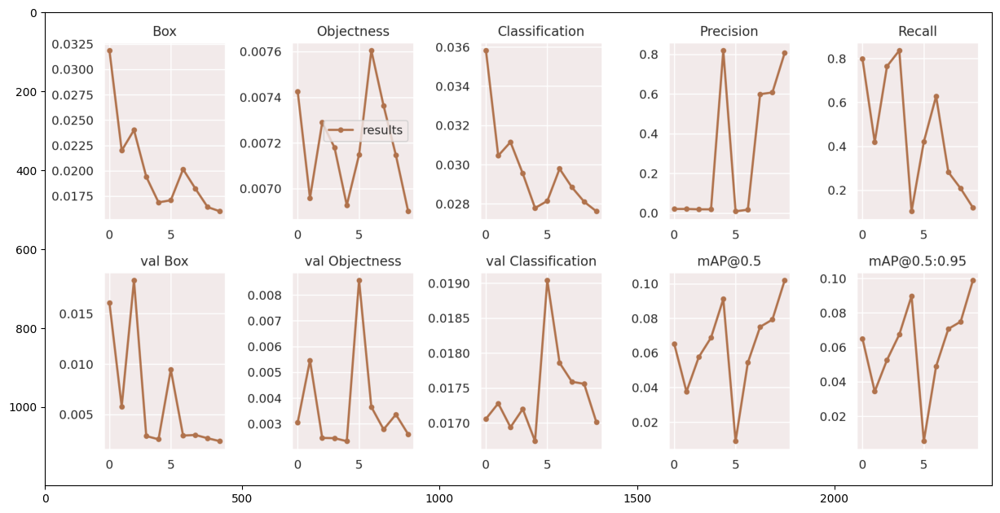

In [12]:
import cv2 as cv  # Import OpenCV
import matplotlib.pyplot as plt 
img = cv.imread("/kaggle/working/yolov7/runs/train/exp/results.png")
plt.figure(figsize=(15, 15))
plt.imshow(img)

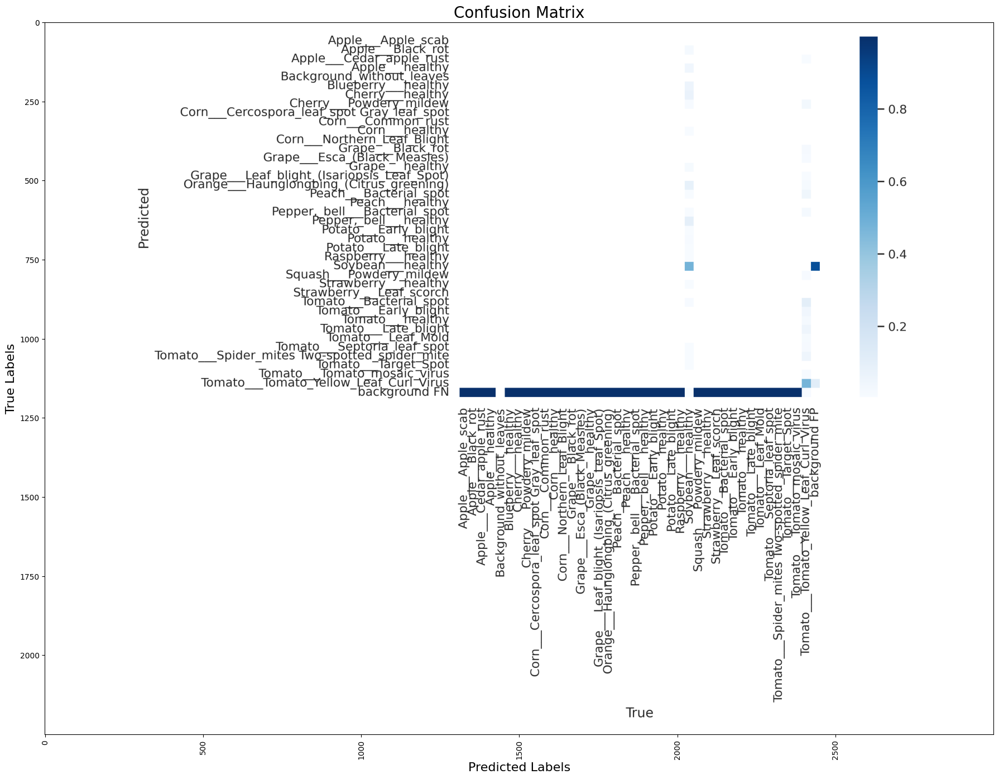

In [20]:
import cv2 as cv  # Import OpenCV
import matplotlib.pyplot as plt

# Load the confusion matrix image
conf_matrix_path = "/kaggle/working/yolov7/runs/train/exp/confusion_matrix.png"
conf_matrix = cv.imread(conf_matrix_path)

# Convert BGR to RGB for proper color rendering
conf_matrix_rgb = cv.cvtColor(conf_matrix, cv.COLOR_BGR2RGB)

# Plot the confusion matrix
plt.figure(figsize=(18, 18))  # Increase figure size for better readability
plt.title("Confusion Matrix", fontsize=20)  # Add a title with larger font size
plt.imshow(conf_matrix_rgb)  # Display the confusion matrix image

# Add labels for axes
plt.xlabel("Predicted Labels", fontsize=16)
plt.ylabel("True Labels", fontsize=16)

# Adjust ticks
plt.xticks(fontsize=10, rotation=90)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=10)

# Ensure all labels fit within the plot
plt.tight_layout()

# Display the plot
plt.show()

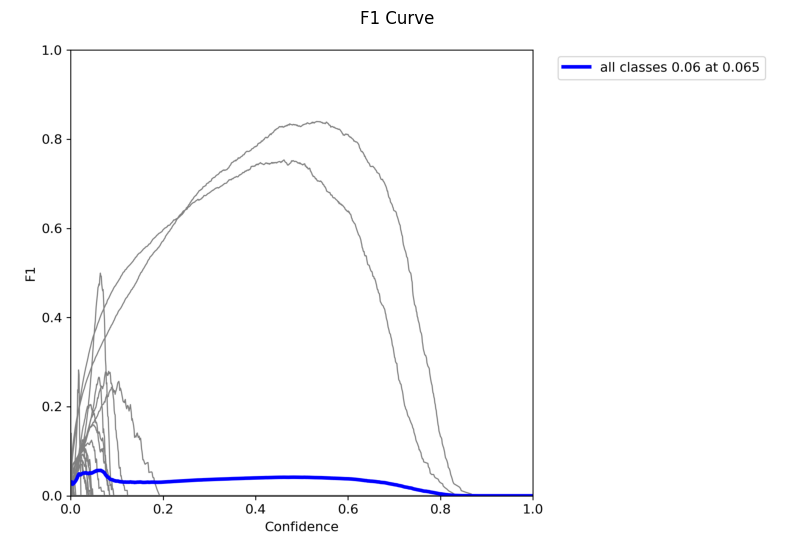

In [24]:
import cv2 as cv
import matplotlib.pyplot as plt

# Paths to F1 curve and confusion matrix images
f1_curve_path = "/kaggle/working/yolov7/runs/train/exp/F1_curve.png"

# Load and display F1 curve
f1_curve = cv.imread(f1_curve_path)
plt.figure(figsize=(10, 10))
plt.title("F1 Curve")
plt.imshow(cv.cvtColor(f1_curve, cv.COLOR_BGR2RGB))
plt.axis('off')  # Hide axes
plt.show()

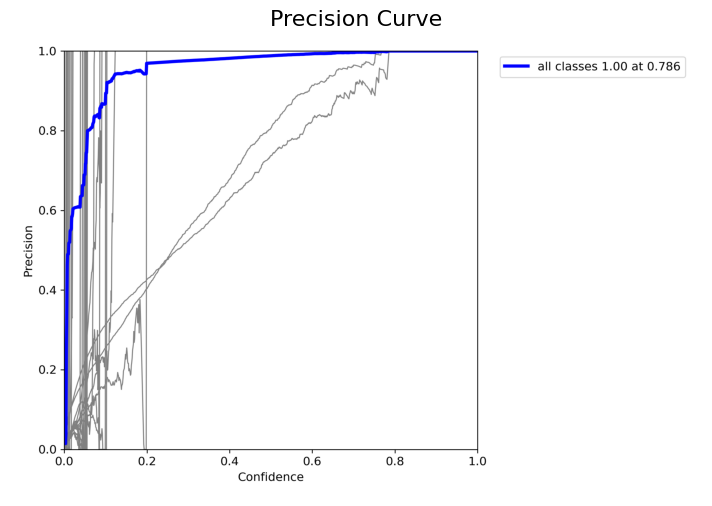

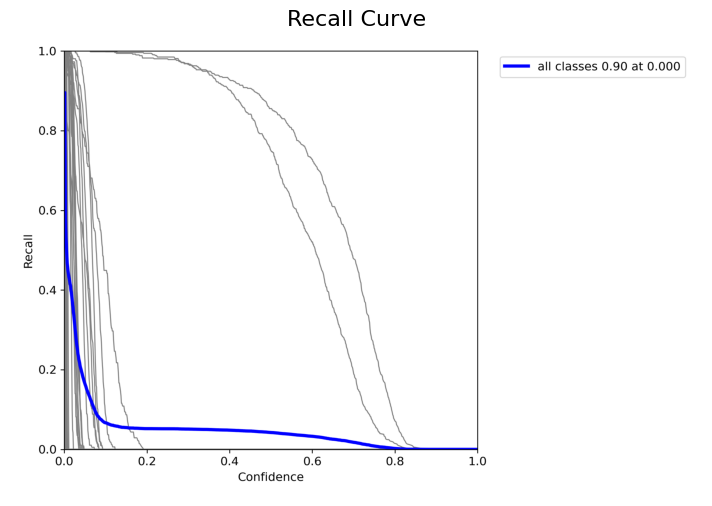

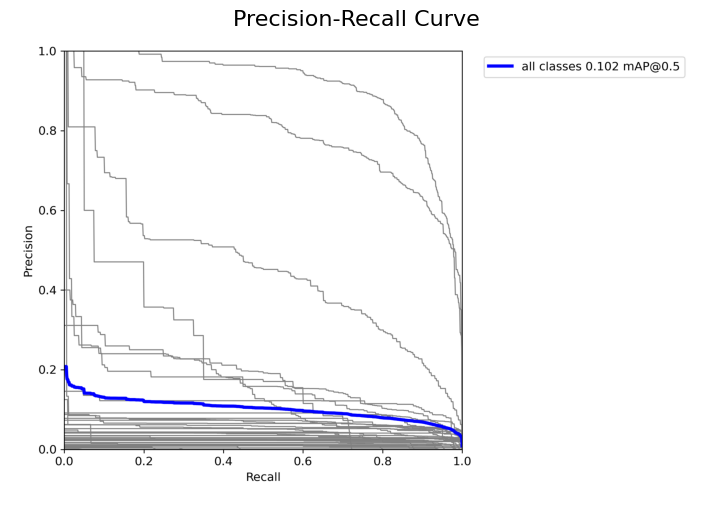

In [25]:
import cv2 as cv
import matplotlib.pyplot as plt

# Paths to the saved curve images
precision_curve_path = "/kaggle/working/yolov7/runs/train/exp/P_curve.png"
recall_curve_path = "/kaggle/working/yolov7/runs/train/exp/R_curve.png"
pr_curve_path = "/kaggle/working/yolov7/runs/train/exp/PR_curve.png"

# Function to display an image
def display_image(image_path, title):
    img = cv.imread(image_path)
    plt.figure(figsize=(10, 6))
    plt.title(title, fontsize=16)
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convert BGR to RGB for proper colors
    plt.axis('off')  # Hide the axes
    plt.show()

# Display the Precision curve
display_image(precision_curve_path, "Precision Curve")

# Display the Recall curve
display_image(recall_curve_path, "Recall Curve")

# Display the Precision-Recall curve
display_image(pr_curve_path, "Precision-Recall Curve")

Namespace(weights=['runs/train/exp/weights/best.pt'], source='/kaggle/working/data/test/images', img_size=640, conf_thres=0.25, iou_thres=0.45, device='', view_img=False, save_txt=True, save_conf=True, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', exist_ok=False, no_trace=False)
/kaggle/working/yolov7/models/experimental.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowl

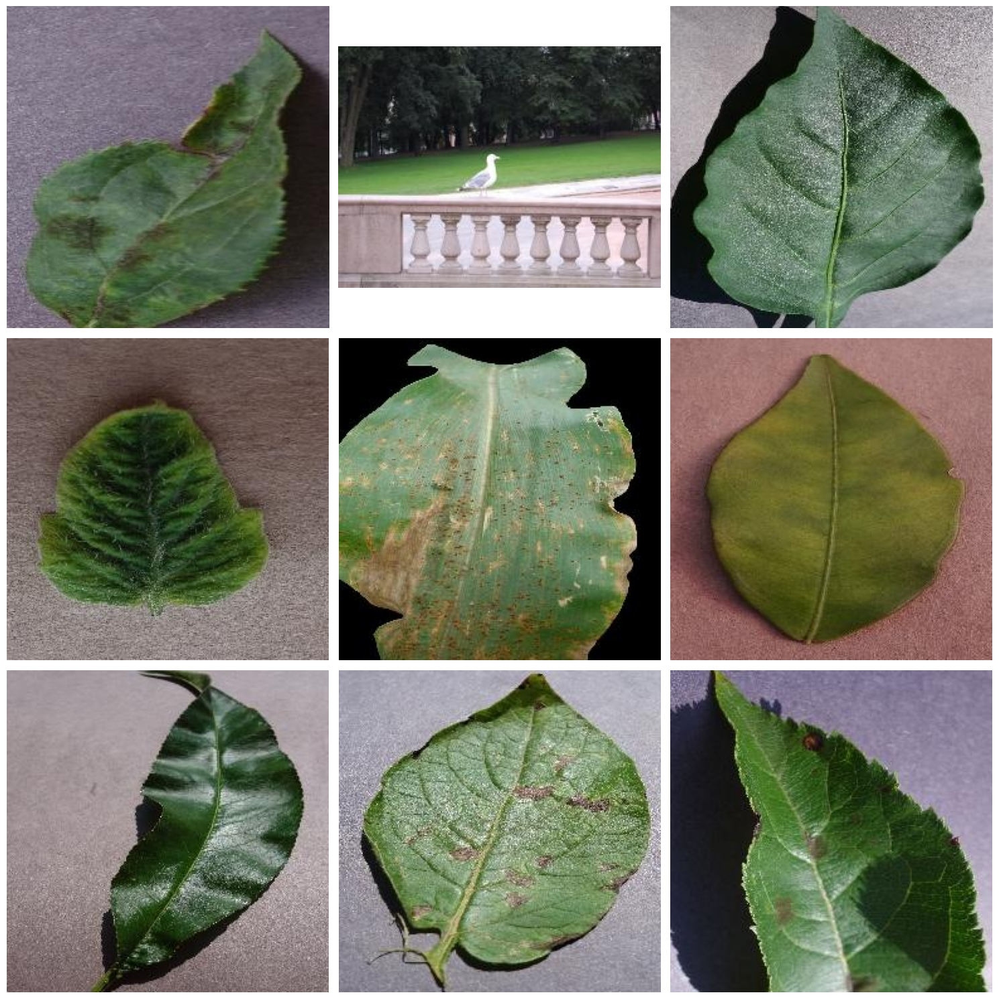

In [31]:
import cv2
import matplotlib.pyplot as plt
from glob import glob

# Path to test images and output directory
test_images = '/kaggle/working/data/test/images'
weights = 'runs/train/exp/weights/best.pt'

# Run inference
!python detect.py --weights {weights} --source {test_images} --img-size 640 --conf-thres 0.25 --save-txt --save-conf

# Visualize results
output_images = glob('runs/detect/exp/*.jpg')

# Display images in a grid
plt.figure(figsize=(15, 15))
for i, img_path in enumerate(output_images[:9]):  # Display first 9 images
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [32]:
!python test.py --weights runs/train/exp/weights/best.pt --data /kaggle/working/data/data.yaml --img-size 416 --batch-size 16

Namespace(weights=['runs/train/exp/weights/best.pt'], data='/kaggle/working/data/data.yaml', batch_size=16, img_size=416, conf_thres=0.001, iou_thres=0.65, task='val', device='', single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project='runs/test', name='exp', exist_ok=False, no_trace=False, v5_metric=False)
/kaggle/working/yolov7/models/experimental.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode u

In [57]:
import re

if overall_metrics:
    precision = overall_metrics.group(1)
    recall = overall_metrics.group(2)
    map50 = overall_metrics.group(3)

    print("Overall Metrics:")
    print("Precision (P):", precision)
    print("Recall (R):", recall)
    print("mAP@0.5:", map50)
else:
    print("Overall metrics not found in the output.")


Overall Metrics:
Precision (P): 0.806
Recall (R): 0.124
mAP@0.5: 0.102
